<a href="https://colab.research.google.com/github/SazSrijith/StrokePrediction/blob/main/PCA_Rice_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip3 install pycaret==3.0.0
from pycaret.utils import version
version()

  Using cached pycaret-3.0.0-py3-none-any.whl (481 kB)
  Attempting uninstall: pycaret
    Found existing installation: pycaret 3.2.0
    Uninstalling pycaret-3.2.0:
      Successfully uninstalled pycaret-3.2.0


'3.0.0'

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

In [3]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [4]:
url = 'https://raw.githubusercontent.com/SazSrijith/StrokePrediction/main/dataset/riceClassification.csv'
df = pd.read_csv(url)
df.head(25)

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,1,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,4,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,5,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
5,6,2990,77.417073,50.954344,0.752861,3080,61.700780,0.584898,216.930,0.798439,1.519342,1
6,7,3556,84.323564,55.413061,0.753762,3636,67.287739,0.750211,227.007,0.867148,1.521727,1
7,8,3788,86.952411,56.444769,0.760664,3866,69.448048,0.800676,235.476,0.858473,1.540487,1
8,9,2629,74.133114,48.074144,0.761228,2790,57.856260,0.640595,207.325,0.768594,1.542058,1
9,10,5719,106.721142,68.977700,0.763053,5819,85.332625,0.754983,281.839,0.904748,1.547183,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               18185 non-null  int64  
 1   Area             18185 non-null  int64  
 2   MajorAxisLength  18185 non-null  float64
 3   MinorAxisLength  18185 non-null  float64
 4   Eccentricity     18185 non-null  float64
 5   ConvexArea       18185 non-null  int64  
 6   EquivDiameter    18185 non-null  float64
 7   Extent           18185 non-null  float64
 8   Perimeter        18185 non-null  float64
 9   Roundness        18185 non-null  float64
 10  AspectRation     18185 non-null  float64
 11  Class            18185 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 1.7 MB


In [6]:
print("Number of duplicated rows is: ", df.duplicated().sum())
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of duplicated rows is:  0
Number of rows with NaNs is:  0


In [7]:
df = df.drop("id", axis=1)

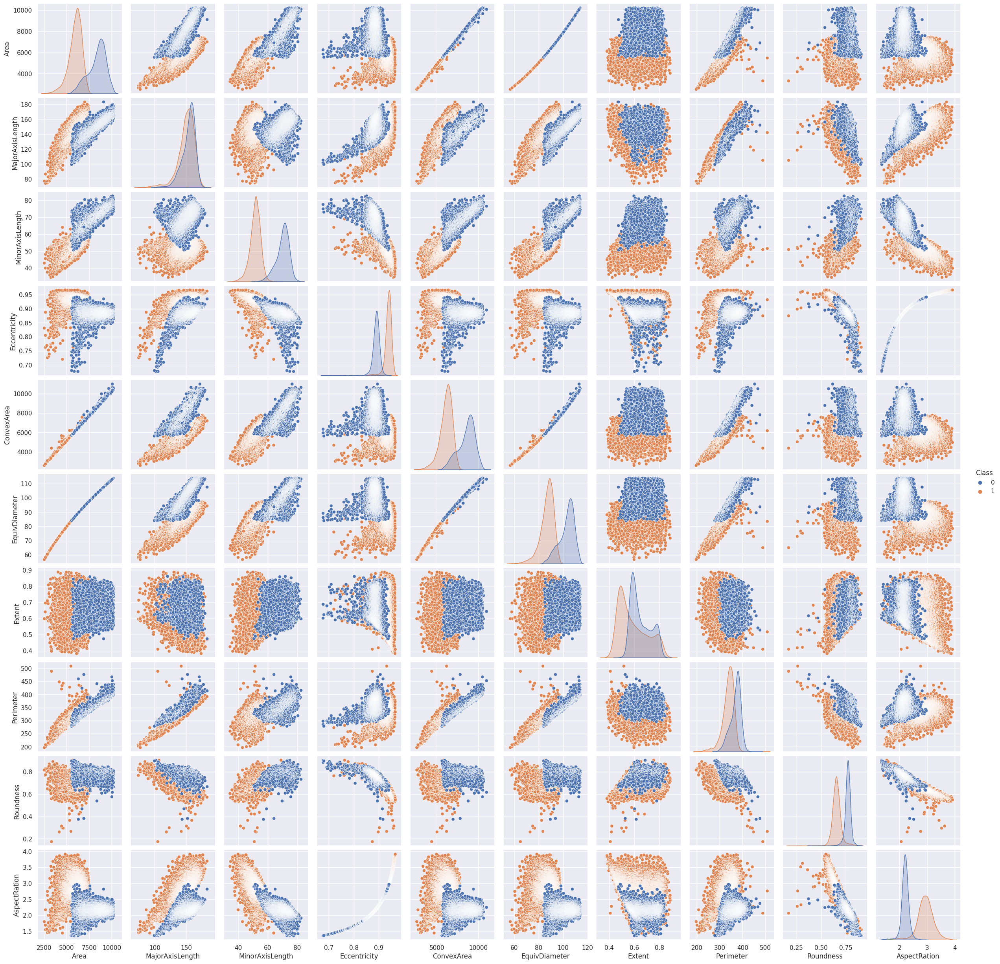

In [8]:
sns.pairplot(df, hue='Class')
plt.show()

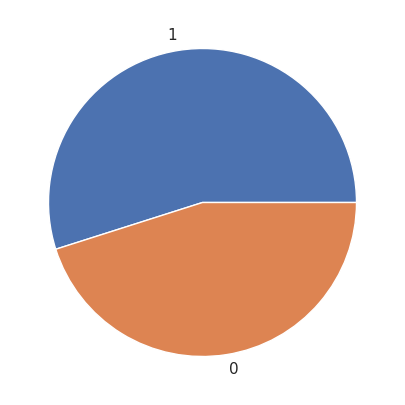

In [9]:
y =df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

In [10]:
X = df.drop(columns=['Class'])
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation
0,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000
5,2990,77.417073,50.954344,0.752861,3080,61.700780,0.584898,216.930,0.798439,1.519342
6,3556,84.323564,55.413061,0.753762,3636,67.287739,0.750211,227.007,0.867148,1.521727
7,3788,86.952411,56.444769,0.760664,3866,69.448048,0.800676,235.476,0.858473,1.540487
8,2629,74.133114,48.074144,0.761228,2790,57.856260,0.640595,207.325,0.768594,1.542058
9,5719,106.721142,68.977700,0.763053,5819,85.332625,0.754983,281.839,0.904748,1.547183


In [11]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,18185.0,7036.492989,1467.197150,2522.000000,5962.000000,6660.000000,8423.000000,10210.000000
MajorAxisLength,18185.0,151.680754,12.376402,74.133114,145.675910,153.883750,160.056214,183.211434
MinorAxisLength,18185.0,59.807851,10.061653,34.409894,51.393151,55.724288,70.156593,82.550762
Eccentricity,18185.0,0.915406,0.030575,0.676647,0.891617,0.923259,0.941372,0.966774
ConvexArea,18185.0,7225.817872,1502.006571,2579.000000,6125.000000,6843.000000,8645.000000,11008.000000
EquivDiameter,18185.0,94.132952,9.906250,56.666658,87.126656,92.085696,103.559146,114.016559
Extent,18185.0,0.616653,0.104389,0.383239,0.538530,0.601194,0.695664,0.886573
Perimeter,18185.0,351.606949,29.500620,197.015000,333.990000,353.088000,373.003000,508.511000
Roundness,18185.0,0.707998,0.067310,0.174590,0.650962,0.701941,0.769280,0.904748
AspectRation,18185.0,2.599081,0.434836,1.358128,2.208527,2.602966,2.964101,3.911845


In [12]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation
0,-1.703630,-4.803744,0.417927,-6.393938,-1.696989,-1.830049,0.391654,-2.661778,0.839588,-2.663800
1,-2.838478,-6.220789,-0.835611,-6.209583,-2.803539,-3.398143,0.923070,-4.857318,1.837215,-2.635418
2,-2.718519,-6.091404,-0.771700,-6.024520,-2.725641,-3.213879,1.365122,-4.799860,2.383587,-2.605950
3,-2.701479,-6.031573,-0.783130,-5.781578,-2.708996,-3.188141,1.598635,-4.777995,2.409877,-2.565690
4,-2.278893,-5.377799,-0.341288,-5.433479,-2.279559,-2.580390,1.463045,-4.111042,2.477331,-2.504645
5,-2.758051,-6.000590,-0.879950,-5.316410,-2.760262,-3.274000,-0.304202,-4.565350,1.343680,-2.483161
6,-2.372271,-5.442538,-0.436798,-5.286951,-2.390080,-2.710001,1.279457,-4.223754,2.364484,-2.477675
7,-2.214142,-5.230124,-0.334257,-5.061184,-2.236948,-2.491920,1.762905,-3.936668,2.235600,-2.434533
8,-3.004105,-6.265938,-1.166213,-5.042738,-2.953342,-3.662101,0.229356,-4.890945,0.900273,-2.430919
9,-0.897991,-3.632788,0.911391,-4.983052,-0.936651,-0.888385,1.325177,-2.365031,2.923116,-2.419132


In [13]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,18185.0,7.502018e-17,1.000027,-3.077035,-0.732364,-0.256614,0.945030,2.163032
MajorAxisLength,18185.0,-1.750471e-15,1.000027,-6.265938,-0.485198,0.178005,0.676747,2.547715
MinorAxisLength,18185.0,-3.876043e-16,1.000027,-2.524303,-0.836337,-0.405865,1.028561,2.260418
Eccentricity,18185.0,-1.369118e-15,1.000027,-7.809152,-0.778086,0.256851,0.849263,1.680082
ConvexArea,18185.0,1.875505e-16,1.000027,-3.093825,-0.732918,-0.254878,0.944883,2.518156
EquivDiameter,18185.0,1.487900e-15,1.000027,-3.782190,-0.707280,-0.206669,0.951566,2.007233
Extent,18185.0,-7.658310e-16,1.000027,-2.236051,-0.748401,-0.148095,0.756913,2.585776
Perimeter,18185.0,-1.137806e-15,1.000027,-5.240439,-0.597189,0.050205,0.725295,5.318816
Roundness,18185.0,2.813257e-16,1.000027,-7.924849,-0.847385,-0.089998,0.910465,2.923116
AspectRation,18185.0,-1.750471e-16,1.000027,-2.853917,-0.898188,0.008934,0.839464,3.019065


In [14]:
observations = list(df.index)
variables = list(df.columns)

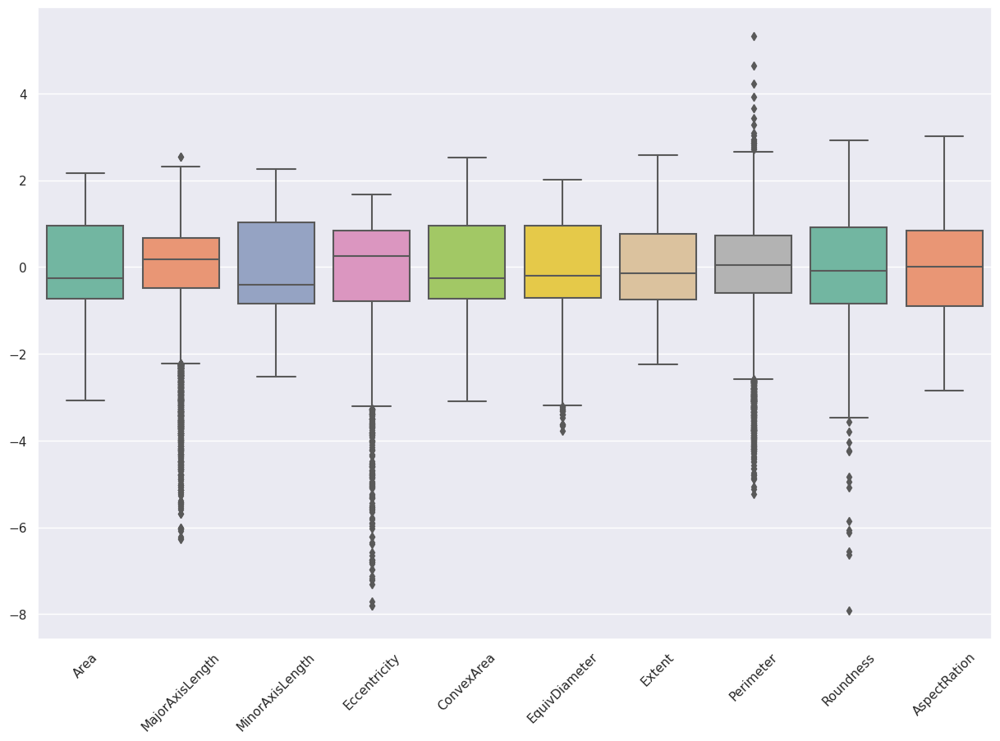

In [15]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

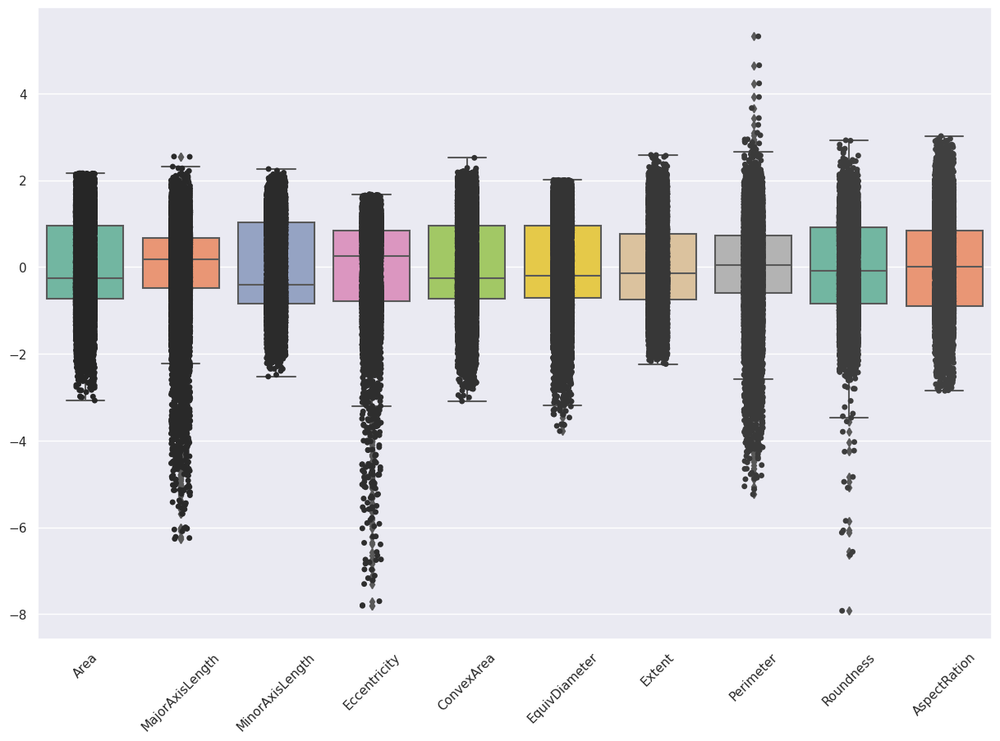

In [16]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

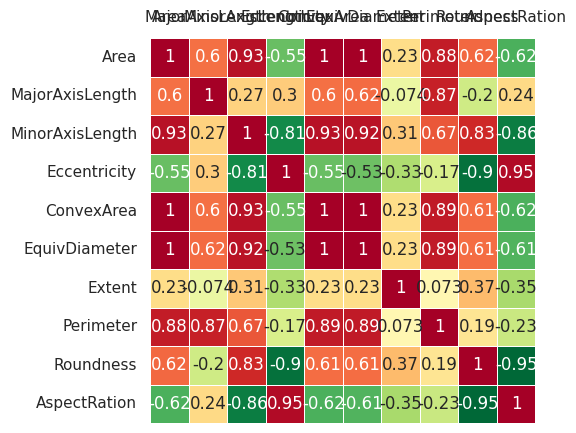

In [17]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);
# X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
# sns.clustermap(X.corr(), annot=True, fmt='.2f')

Text(0, 0.5, 'Z2')

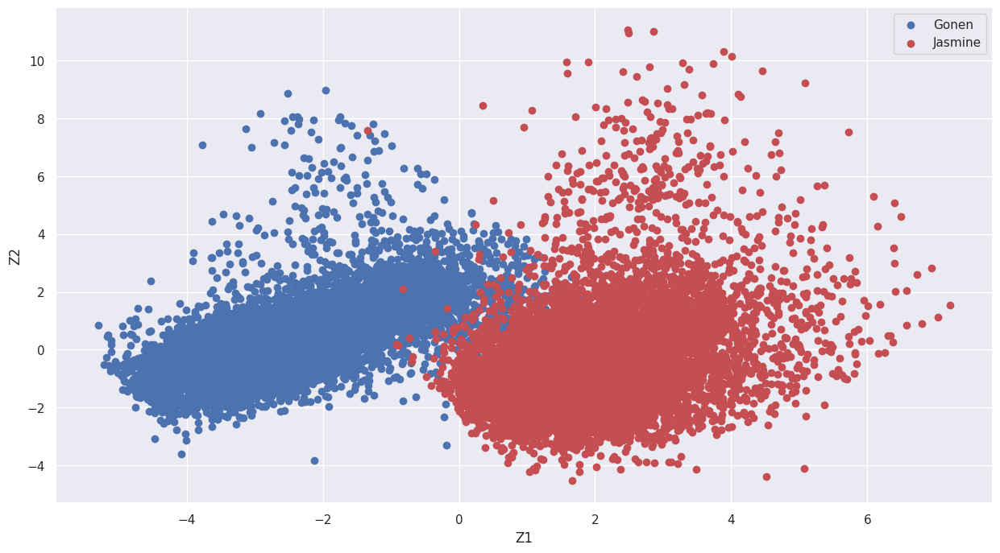

In [18]:
pca = PCA()
Z = pca.fit_transform(X)

# 1(Jasmine->1,  Gonen->0)
idx_Gonen = np.where(y == 0)
idx_Jasmine = np.where(y == 1)

plt. figure(figsize=(15,8))
plt.scatter(Z[idx_Gonen,0], Z[idx_Gonen,1], c='b', label='Gonen')
plt.scatter(Z[idx_Jasmine,0], Z[idx_Jasmine,1], c='r', label='Jasmine')

plt.legend()
plt.xlabel('Z1')
plt.ylabel('Z2')

**Eigenvectors**

array([[-3.82711630e-01, -1.54080516e-01, -1.85952483e-02,
        -9.47182662e-02,  4.86722024e-02,  4.25135577e-01,
        -2.63757801e-01,  1.63361821e-01, -4.92808717e-01,
         5.46121538e-01],
       [-1.53667795e-01, -5.63744588e-01,  9.79499107e-02,
        -1.93224954e-01, -3.79695762e-01, -4.53584819e-01,
        -3.45618750e-01, -3.12732230e-01,  1.48039599e-01,
         1.50235247e-01],
       [-3.92051947e-01,  6.92364875e-02, -7.07274017e-02,
         7.83622592e-02,  7.48669016e-02,  1.46119325e-01,
         5.15517900e-01, -5.42974618e-01,  3.41571430e-01,
         3.55178092e-01],
       [ 2.91012186e-01, -3.87247843e-01,  1.37661138e-01,
        -5.45394886e-01,  6.42874661e-01,  4.26434089e-02,
         1.59920781e-01, -2.51651507e-02,  6.53244736e-02,
         5.79941944e-02],
       [-3.82111043e-01, -1.57654605e-01, -2.00274120e-02,
        -3.09522649e-02,  1.04730661e-01,  4.77527614e-01,
        -3.57657601e-01,  9.04436745e-02,  5.09537291e-01,
        -4.

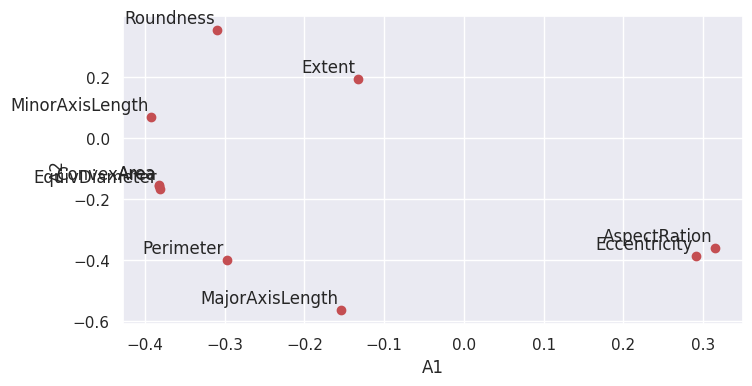

In [19]:
A = pca.components_.T
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('A1')
plt.ylabel('A2')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A

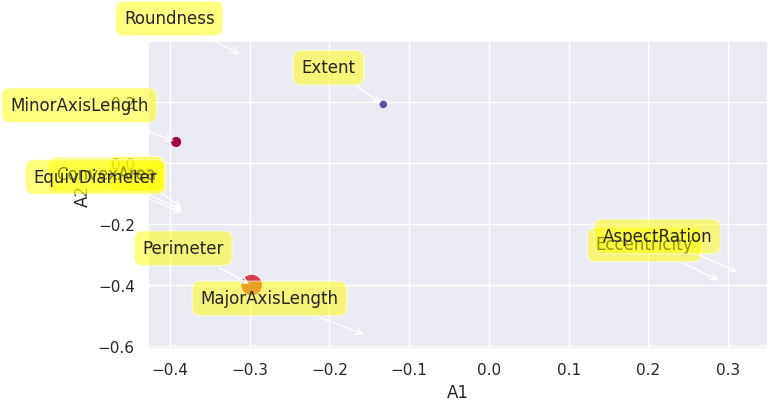

In [20]:
plt. figure(figsize=(8,4))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('A1')
plt.ylabel('A2')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree Plot**

array([6.38246162e+00, 2.60627856e+00, 8.38749613e-01, 1.14902472e-01,
       4.48562668e-02, 8.59683693e-03, 2.57994437e-03, 1.54518501e-03,
       4.01613916e-04, 1.77825801e-04])

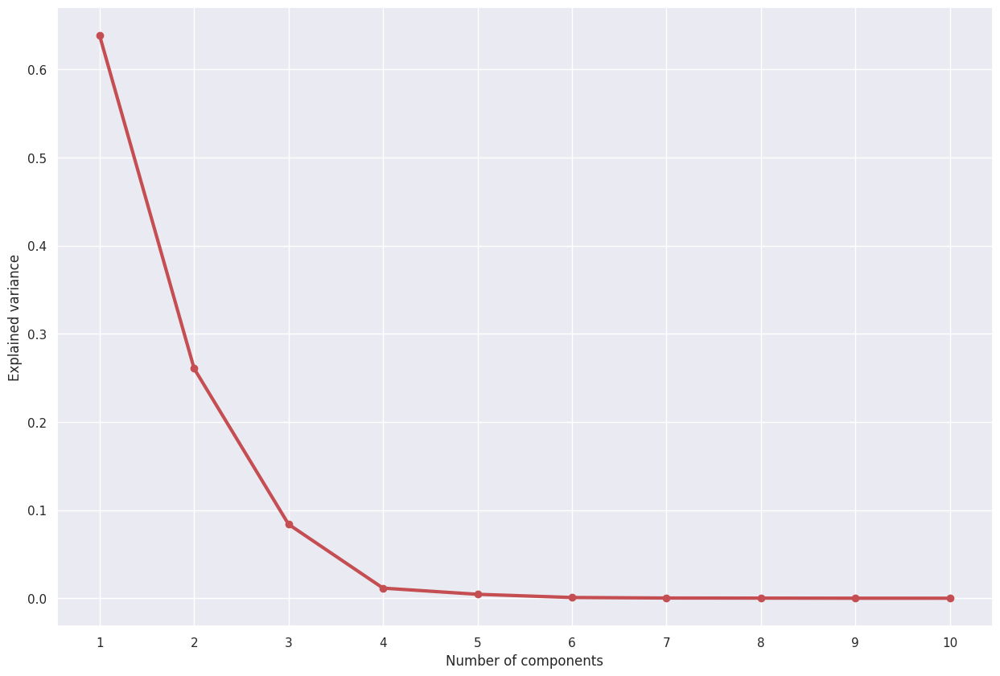

In [21]:
#Eigenvalues
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

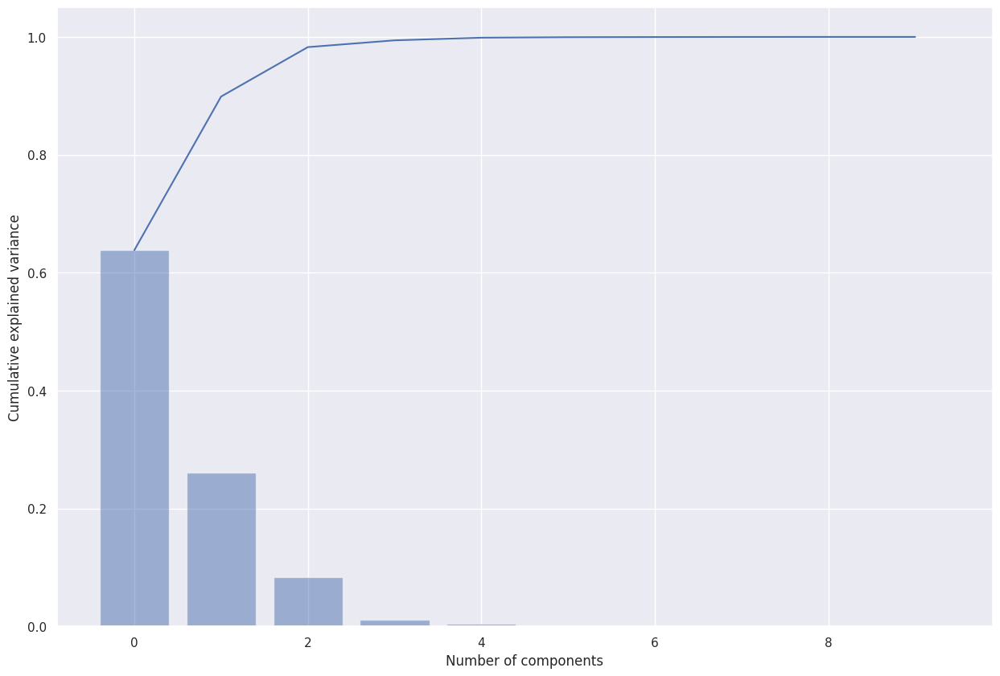

In [22]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Bi Plot**

array([ 8.44244654, 11.01374522, 11.05660034, ..., -0.66273891,
       -0.80484537, -0.71083772])

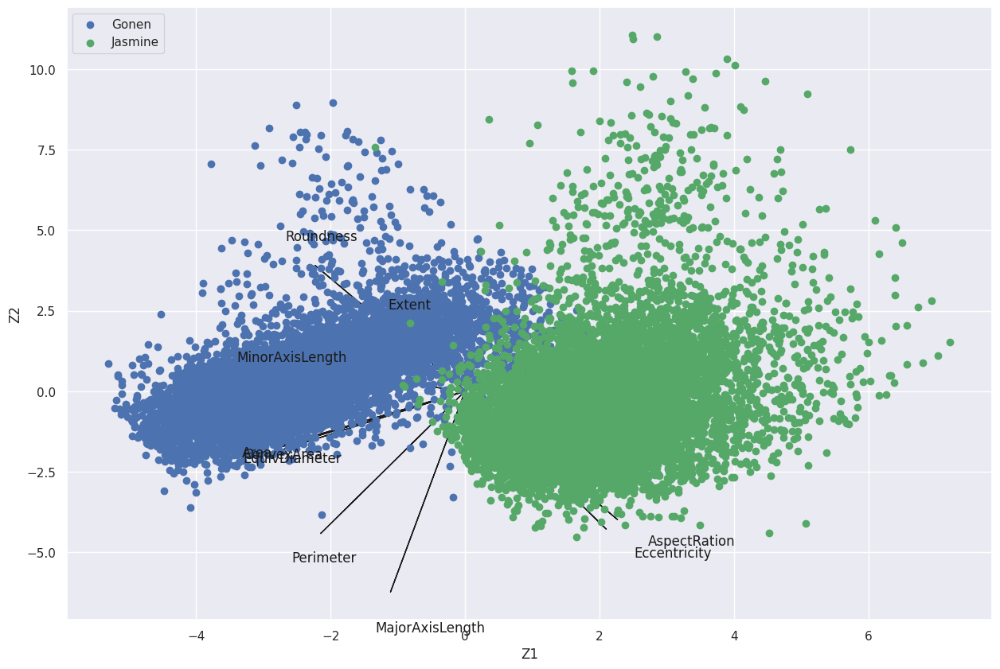

In [23]:
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('Z1')
plt.ylabel('Z2')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Gonen,0], Z[idx_Gonen,1], c='b', label='Gonen')
plt.scatter(Z[idx_Jasmine,0], Z[idx_Jasmine,1], c='g', label='Jasmine')

plt.legend(loc='upper left')
Z1
Z2

**Principal Component Analysis**

In [24]:
!pip install pca

In [25]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [10] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [10] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [26]:
out['PC']

,PC1,PC2,PC3
0,0.354083,8.442447,-1.355742
1,2.854920,11.013745,-0.931820
2,2.482805,11.056600,-0.515969
3,2.493232,10.949386,-0.246925
4,1.581389,9.952350,-0.305457
...,...,...,...
18180,2.294296,-0.298537,-0.786845
18181,-0.224148,-2.334744,0.724407
18182,1.488253,-0.662739,-0.197156
18183,2.203078,-0.804845,-0.773643


**Scatter Plot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot: title={'center': '3 Principal Components explain [99.41%] of the variance'}, xlabel='PC1 (63.8% expl.var)', ylabel='PC2 (26.0% expl.var)'>)

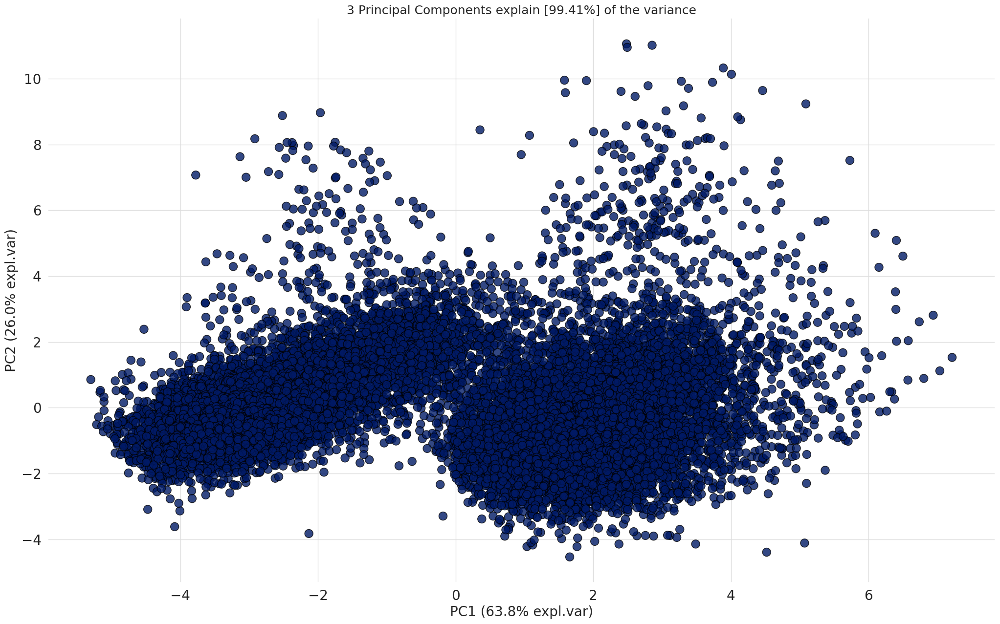

In [27]:
model.scatter(label=True, legend=False)

**Eigen Vectors**

In [28]:
A = out['loadings'].T
A

,PC1,PC2,PC3
Area,-0.382712,-0.154081,-0.018595
MajorAxisLength,-0.153668,-0.563745,0.097950
MinorAxisLength,-0.392052,0.069236,-0.070727
Eccentricity,0.291012,-0.387248,0.137661
ConvexArea,-0.382111,-0.157655,-0.020027
EquivDiameter,-0.380981,-0.165921,-0.015129
Extent,-0.132351,0.192156,0.971641
Perimeter,-0.297461,-0.399377,0.024917
Roundness,-0.308990,0.353253,-0.083476
AspectRation,0.314476,-0.360693,0.117483


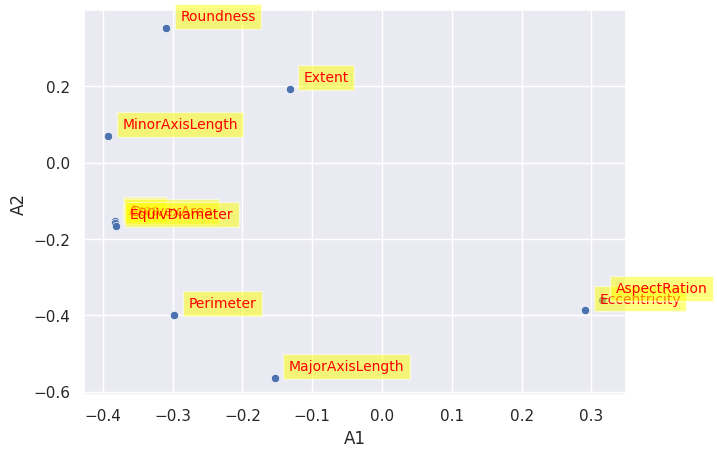

In [29]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('A1')
plt.ylabel('A2')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

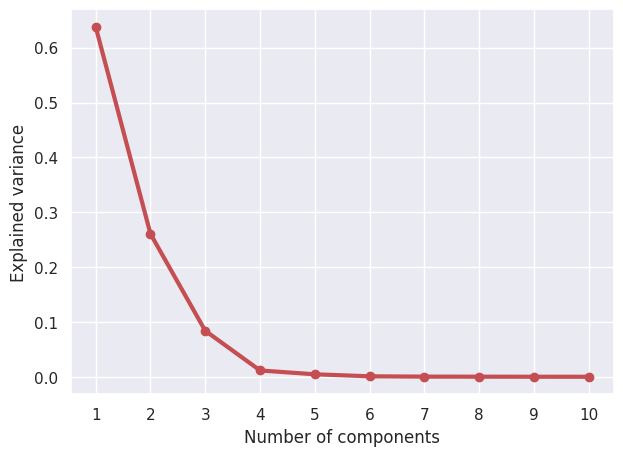

In [30]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

**Explained Variance Plot**

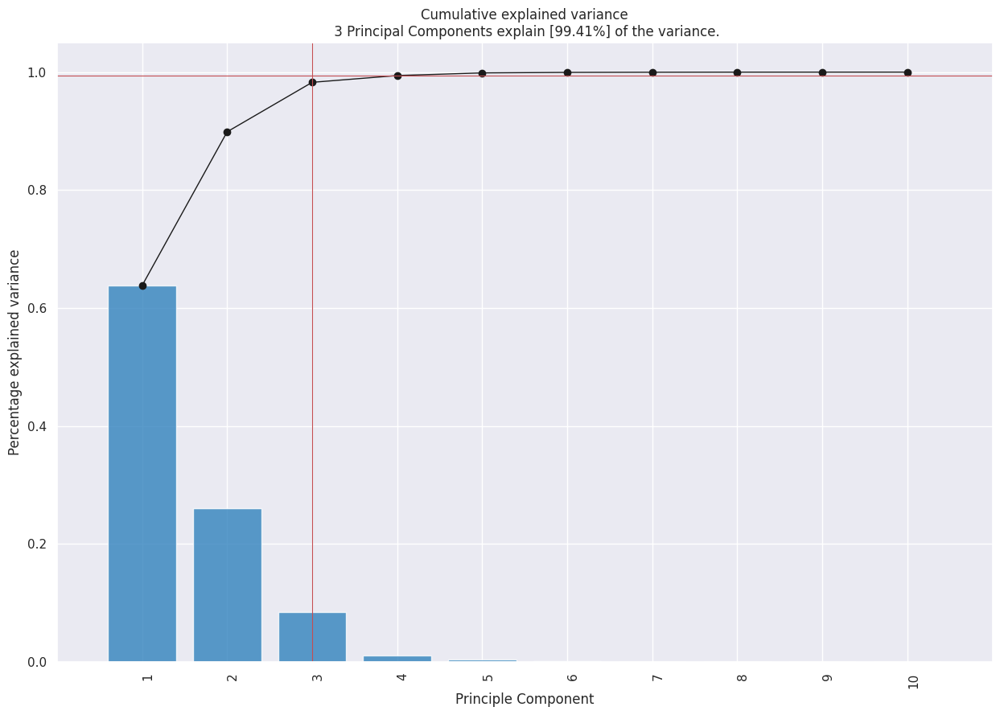

In [31]:
model.plot();

**Biplot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot: title={'center': '3 Principal Components explain [99.41%] of the variance'}, xlabel='PC1 (63.8% expl.var)', ylabel='PC2 (26.0% expl.var)'>)

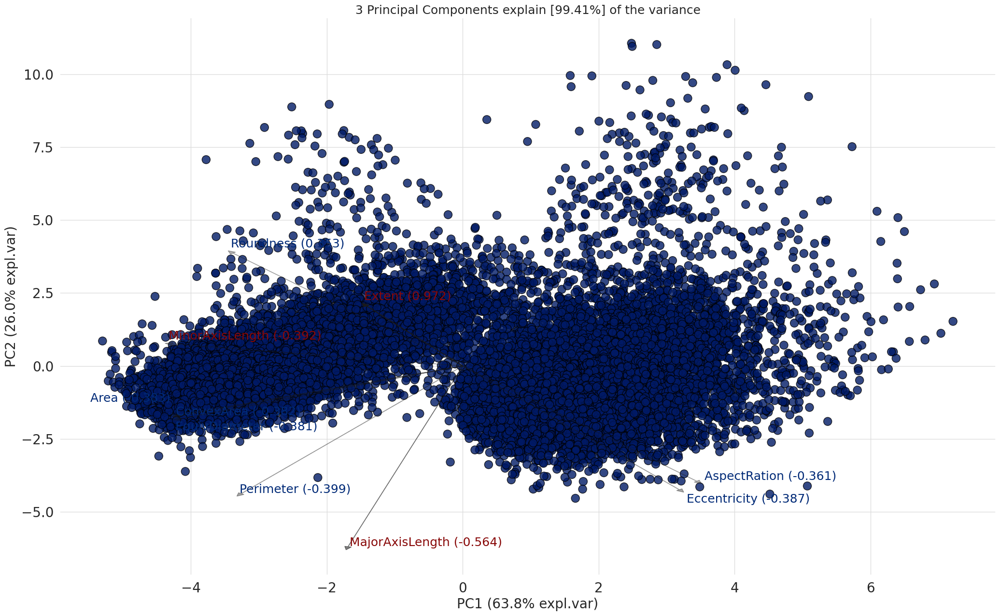

In [32]:
model.biplot(label=False, legend=False, color_arrow='k')

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


[scatterd] >INFO> Create scatterplot


(<Figure size 3000x2500 with 1 Axes>,
 <Axes3DSubplot: title={'center': '3 Principal Components explain [99.41%] of the variance'}, xlabel='PC1 (63.8% expl.var)', ylabel='PC2 (26.0% expl.var)', zlabel='PC3 (8.38% expl.var)'>)

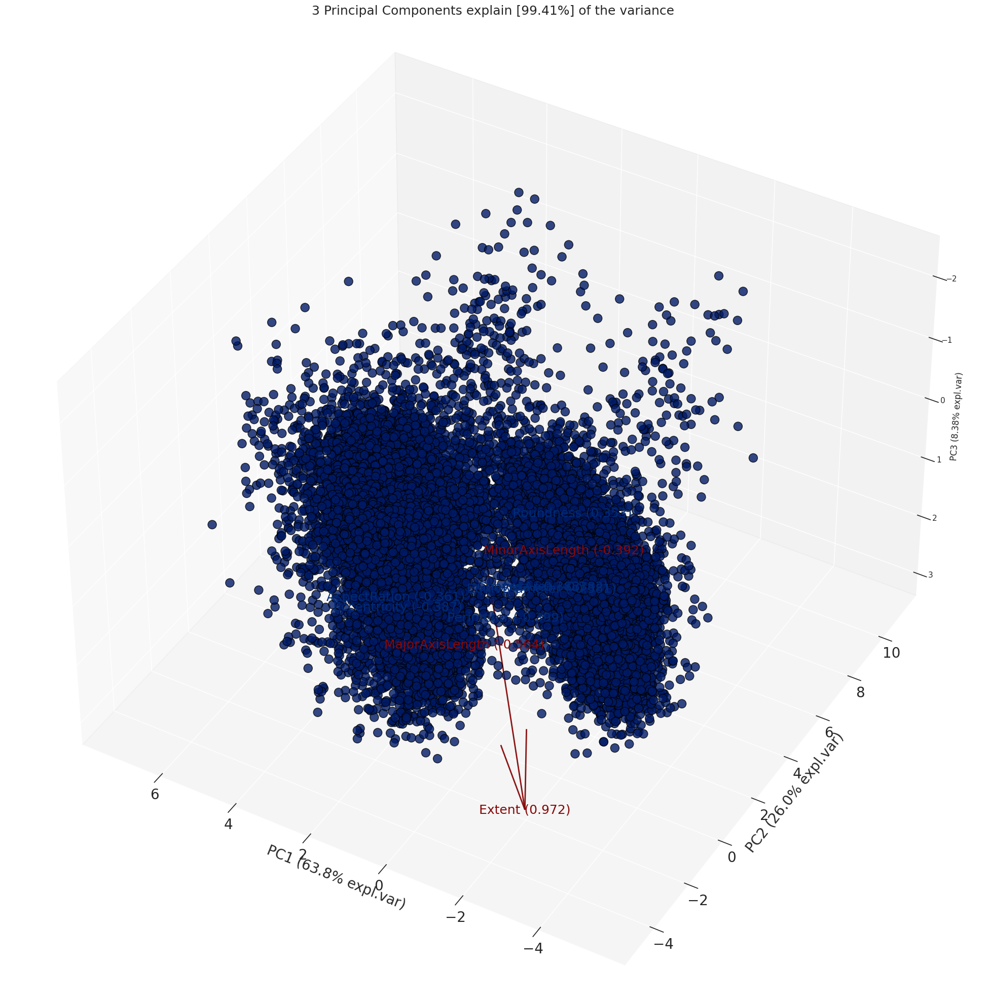

In [33]:
model.biplot3d(legend=False)

# Classification using Pycaret

In [34]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (16366, 11)
Unseen Data For Predictions: (1819, 11)


In [35]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Binary
3,Original data shape,"(16366, 11)"
4,Transformed data shape,"(16366, 11)"
5,Transformed train set shape,"(11456, 11)"
6,Transformed test set shape,"(4910, 11)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


**Comparing All Models**

In [36]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9895,0.9979,0.9925,0.9884,0.9905,0.9788,0.9789,0.4150
lr,Logistic Regression,0.9893,0.9987,0.9933,0.9872,0.9902,0.9783,0.9784,1.5130
qda,Quadratic Discriminant Analysis,0.9892,0.9983,0.9936,0.9867,0.9902,0.9781,0.9782,0.2670
ada,Ada Boost Classifier,0.9890,0.9987,0.9917,0.9883,0.9900,0.9778,0.9778,0.2680
et,Extra Trees Classifier,0.9890,0.9980,0.9914,0.9886,0.9900,0.9778,0.9778,0.4910
xgboost,Extreme Gradient Boosting,0.9890,0.9984,0.9922,0.9878,0.9900,0.9778,0.9778,0.1860
lightgbm,Light Gradient Boosting Machine,0.9889,0.9989,0.9916,0.9883,0.9899,0.9776,0.9776,0.2330
gbc,Gradient Boosting Classifier,0.9888,0.9983,0.9924,0.9873,0.9898,0.9774,0.9775,0.3700
ridge,Ridge Classifier,0.9877,0.0000,0.9971,0.9807,0.9889,0.9751,0.9753,0.1540
lda,Linear Discriminant Analysis,0.9873,0.9988,0.9963,0.9807,0.9885,0.9742,0.9744,0.3830


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [37]:
best_model

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)

**Tune Random Forest Classifier Model (Best Model)**

In [38]:
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.9993,0.9904,0.9889,0.9897,0.9771,0.9771
1,0.9913,0.9995,0.9968,0.9874,0.9921,0.9824,0.9824
2,0.9869,0.9993,0.9857,0.9904,0.9880,0.9736,0.9736
3,0.9869,0.9965,0.9889,0.9873,0.9881,0.9736,0.9736
4,0.9904,0.9992,0.9952,0.9874,0.9913,0.9806,0.9806
5,0.9948,0.9997,0.9936,0.9968,0.9952,0.9894,0.9894
6,0.9886,0.9988,0.9904,0.9889,0.9896,0.9771,0.9771
7,0.9921,0.9997,0.9936,0.9920,0.9928,0.9841,0.9841
8,0.9869,0.9987,0.9904,0.9857,0.9881,0.9735,0.9736


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [39]:
tuned_best_model

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)

**Evaluate Random Forest Classifier Model (Best Model)**

In [40]:
evaluate_model(tuned_best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create Logistic Regression Model**

In [41]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9895,0.9994,0.9920,0.9889,0.9905,0.9789,0.9789
1,0.9860,0.9976,0.9936,0.9811,0.9873,0.9718,0.9719
2,0.9878,0.9993,0.9873,0.9904,0.9888,0.9753,0.9754
3,0.9895,0.9968,0.9936,0.9873,0.9905,0.9788,0.9789
4,0.9895,0.9995,0.9936,0.9873,0.9905,0.9788,0.9789
5,0.9939,0.9990,0.9936,0.9952,0.9944,0.9877,0.9877
6,0.9886,0.9986,0.9936,0.9858,0.9897,0.9771,0.9771
7,0.9878,0.9994,0.9936,0.9842,0.9889,0.9753,0.9754
8,0.9904,0.9987,0.9952,0.9873,0.9913,0.9806,0.9806


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [42]:
lr

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Tune Logistic Regression Model**

In [43]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9904,0.9993,0.9936,0.9889,0.9913,0.9806,0.9806
1,0.9869,0.9977,0.9936,0.9827,0.9881,0.9735,0.9736
2,0.9887,0.9993,0.9873,0.9920,0.9896,0.9771,0.9771
3,0.9904,0.9968,0.9952,0.9874,0.9913,0.9806,0.9806
4,0.9895,0.9993,0.9936,0.9873,0.9905,0.9788,0.9789
5,0.9965,0.9986,0.9968,0.9968,0.9968,0.9930,0.9930
6,0.9895,0.9985,0.9936,0.9873,0.9905,0.9788,0.9789
7,0.9878,0.9992,0.9936,0.9842,0.9889,0.9753,0.9754
8,0.9878,0.9984,0.9936,0.9842,0.9889,0.9753,0.9754


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [44]:
tuned_lr

LogisticRegression(C=0.056, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [45]:
pip install pycaret --upgrade

  Using cached pycaret-3.2.0-py3-none-any.whl (484 kB)
  Attempting uninstall: pycaret
    Found existing installation: pycaret 3.0.0
    Uninstalling pycaret-3.0.0:
      Successfully uninstalled pycaret-3.0.0


**Evaluate Logistic Regression Model**

In [46]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create Quadratic Discriminant Analysis Model**

In [47]:
qda = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.9992,0.9936,0.9858,0.9897,0.9771,0.9771
1,0.9869,0.9985,0.9968,0.9797,0.9882,0.9735,0.9737
2,0.9878,0.9994,0.9873,0.9904,0.9888,0.9753,0.9754
3,0.9887,0.9956,0.9952,0.9843,0.9897,0.9771,0.9771
4,0.9895,0.9994,0.9936,0.9873,0.9905,0.9788,0.9789
5,0.9956,0.9979,0.9952,0.9968,0.9960,0.9912,0.9912
6,0.9878,0.9985,0.9936,0.9842,0.9889,0.9753,0.9754
7,0.9904,0.9987,0.9936,0.9889,0.9912,0.9806,0.9806
8,0.9869,0.9973,0.9920,0.9842,0.9881,0.9735,0.9736


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [48]:
qda

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

**Tune Quadratic Discriminant Analysis Model**

In [49]:
tuned_qda = tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9869,0.9957,0.9936,0.9827,0.9881,0.9735,0.9736
1,0.9869,0.9950,0.9984,0.9782,0.9882,0.9735,0.9738
2,0.9887,0.9971,0.9904,0.9889,0.9897,0.9771,0.9771
3,0.9878,0.9939,0.9984,0.9797,0.9890,0.9753,0.9755
4,0.9913,0.9959,0.9968,0.9874,0.9921,0.9824,0.9824
5,0.9956,0.9980,0.9968,0.9952,0.9960,0.9912,0.9912
6,0.9869,0.9959,0.9984,0.9781,0.9882,0.9735,0.9738
7,0.9878,0.9987,0.9984,0.9797,0.9889,0.9753,0.9755
8,0.9886,0.9967,0.9968,0.9827,0.9897,0.9771,0.9772


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [50]:
tuned_qda

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

**Evaluate Quadratic Discriminant Analysis Model**

In [51]:
evaluate_model(tuned_qda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…



---


# **Classification + PCA**

In [52]:
clf_pca = setup(data=data, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Binary
3,Original data shape,"(16366, 11)"
4,Transformed data shape,"(16366, 4)"
5,Transformed train set shape,"(11456, 4)"
6,Transformed test set shape,"(4910, 4)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


**Comparing Models + PCA**

In [53]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
knn,K Neighbors Classifier,0.9894,0.9948,0.9928,0.9880,0.9904,0.9787,0.9787,0.3600
et,Extra Trees Classifier,0.9892,0.9981,0.9933,0.9870,0.9902,0.9781,0.9782,0.7770
rf,Random Forest Classifier,0.9889,0.9976,0.9928,0.9870,0.9899,0.9776,0.9776,2.1480
gbc,Gradient Boosting Classifier,0.9881,0.9978,0.9906,0.9878,0.9892,0.9760,0.9760,1.5950
lightgbm,Light Gradient Boosting Machine,0.9881,0.9984,0.9909,0.9875,0.9892,0.9760,0.9761,0.9250
qda,Quadratic Discriminant Analysis,0.9875,0.9987,0.9967,0.9809,0.9887,0.9748,0.9749,0.1260
lr,Logistic Regression,0.9874,0.9984,0.9922,0.9850,0.9886,0.9746,0.9747,0.2280
ada,Ada Boost Classifier,0.9874,0.9982,0.9901,0.9870,0.9885,0.9746,0.9746,0.5850
svm,SVM - Linear Kernel,0.9873,0.0000,0.9920,0.9849,0.9884,0.9743,0.9743,0.3130
xgboost,Extreme Gradient Boosting,0.9866,0.9980,0.9887,0.9870,0.9878,0.9730,0.9731,0.2420


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

**Best model + PCA**

In [54]:
best_model_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

**Tune K Neighbors Classifier Model (Best Model)**

In [55]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9895,0.9984,0.9920,0.9889,0.9905,0.9789,0.9789
1,0.9913,0.9956,0.9984,0.9858,0.9921,0.9824,0.9825
2,0.9878,0.9993,0.9889,0.9889,0.9889,0.9753,0.9753
3,0.9895,0.9953,0.9952,0.9858,0.9905,0.9788,0.9789
4,0.9904,0.9993,0.9952,0.9874,0.9913,0.9806,0.9806
5,0.9948,0.9978,0.9936,0.9968,0.9952,0.9894,0.9894
6,0.9913,0.9981,0.9952,0.9889,0.9921,0.9824,0.9824
7,0.9895,0.9984,0.9936,0.9873,0.9905,0.9788,0.9789
8,0.9904,0.9948,0.9920,0.9904,0.9912,0.9806,0.9806


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [56]:
tuned_best_model_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=42, p=2,
                     weights='distance')

**Evaluate K Nearest Neighbors Classifier Model (Best Model)**

In [57]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create Random Forrest Classifier Model (PCA)**

In [58]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.9984,0.9904,0.9889,0.9897,0.9771,0.9771
1,0.9913,0.9972,0.9984,0.9858,0.9921,0.9824,0.9825
2,0.9852,0.9977,0.9841,0.9888,0.9864,0.9701,0.9701
3,0.9895,0.9942,0.9952,0.9858,0.9905,0.9788,0.9789
4,0.9887,0.9985,0.9952,0.9843,0.9897,0.9771,0.9771
5,0.9965,0.9990,0.9968,0.9968,0.9968,0.9930,0.9930
6,0.9878,0.9970,0.9936,0.9842,0.9889,0.9753,0.9754
7,0.9878,0.9987,0.9920,0.9857,0.9889,0.9753,0.9753
8,0.9860,0.9966,0.9888,0.9857,0.9873,0.9718,0.9718


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [59]:
rf_pca

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)

**Tune Random Forrest Classifier Model (PCA)**

In [60]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9913,0.9986,0.9920,0.9920,0.9920,0.9824,0.9824
1,0.9887,0.9966,0.9952,0.9843,0.9897,0.9771,0.9771
2,0.9869,0.9972,0.9857,0.9904,0.9880,0.9736,0.9736
3,0.9860,0.9965,0.9873,0.9873,0.9873,0.9718,0.9718
4,0.9887,0.9981,0.9952,0.9843,0.9897,0.9771,0.9771
5,0.9913,0.9985,0.9904,0.9936,0.9920,0.9824,0.9824
6,0.9834,0.9953,0.9856,0.9841,0.9849,0.9665,0.9665
7,0.9895,0.9964,0.9888,0.9920,0.9904,0.9789,0.9789
8,0.9834,0.9978,0.9856,0.9841,0.9849,0.9665,0.9665


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [61]:
tuned_rf_pca

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)

**Evaluate Random Forest Classifier Model (PCA)**

In [62]:
evaluate_model(tuned_rf_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create Extra Trees Classifier Model(PCA)**

In [63]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9895,0.9992,0.9920,0.9889,0.9905,0.9789,0.9789
1,0.9904,0.9981,0.9984,0.9843,0.9913,0.9806,0.9807
2,0.9869,0.9990,0.9873,0.9888,0.9880,0.9736,0.9736
3,0.9887,0.9966,0.9936,0.9858,0.9897,0.9771,0.9771
4,0.9895,0.9988,0.9952,0.9858,0.9905,0.9788,0.9789
5,0.9948,0.9972,0.9936,0.9968,0.9952,0.9894,0.9894
6,0.9878,0.9979,0.9936,0.9842,0.9889,0.9753,0.9754
7,0.9886,0.9994,0.9936,0.9858,0.9897,0.9771,0.9771
8,0.9886,0.9971,0.9920,0.9873,0.9897,0.9771,0.9771


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [64]:
et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

**Tune Extra Trees Classifier Model (PCA)**

In [65]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9843,0.9991,0.9936,0.9781,0.9858,0.9682,0.9684
1,0.9834,0.9988,0.9936,0.9765,0.9850,0.9665,0.9667
2,0.9860,0.9988,0.9857,0.9888,0.9872,0.9718,0.9718
3,0.9878,0.9967,0.9968,0.9812,0.9889,0.9753,0.9755
4,0.9869,0.9989,0.9952,0.9812,0.9881,0.9735,0.9737
5,0.9965,0.9997,0.9984,0.9952,0.9968,0.9930,0.9930
6,0.9852,0.9982,0.9968,0.9766,0.9866,0.9700,0.9702
7,0.9878,0.9989,0.9968,0.9812,0.9889,0.9753,0.9754
8,0.9869,0.9980,0.9952,0.9811,0.9881,0.9735,0.9736


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [66]:
tuned_et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

Evaluate Extra Trees Classifier Model (PCA)

In [67]:
evaluate_model(tuned_et_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Explainable AI with Shapley values

In [68]:
!pip install shap

In [69]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.9984,0.9904,0.9889,0.9897,0.9771,0.9771
1,0.9913,0.9972,0.9984,0.9858,0.9921,0.9824,0.9825
2,0.9852,0.9977,0.9841,0.9888,0.9864,0.9701,0.9701
3,0.9895,0.9942,0.9952,0.9858,0.9905,0.9788,0.9789
4,0.9887,0.9985,0.9952,0.9843,0.9897,0.9771,0.9771
5,0.9965,0.9990,0.9968,0.9968,0.9968,0.9930,0.9930
6,0.9878,0.9970,0.9936,0.9842,0.9889,0.9753,0.9754
7,0.9878,0.9987,0.9920,0.9857,0.9889,0.9753,0.9753
8,0.9860,0.9966,0.9888,0.9857,0.9873,0.9718,0.9718


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [70]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9913,0.9986,0.9920,0.9920,0.9920,0.9824,0.9824
1,0.9887,0.9966,0.9952,0.9843,0.9897,0.9771,0.9771
2,0.9869,0.9972,0.9857,0.9904,0.9880,0.9736,0.9736
3,0.9860,0.9965,0.9873,0.9873,0.9873,0.9718,0.9718
4,0.9887,0.9981,0.9952,0.9843,0.9897,0.9771,0.9771
5,0.9913,0.9985,0.9904,0.9936,0.9920,0.9824,0.9824
6,0.9834,0.9953,0.9856,0.9841,0.9849,0.9665,0.9665
7,0.9895,0.9964,0.9888,0.9920,0.9904,0.9789,0.9789
8,0.9834,0.9978,0.9856,0.9841,0.9849,0.9665,0.9665


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


**SHAP Summary Plot**

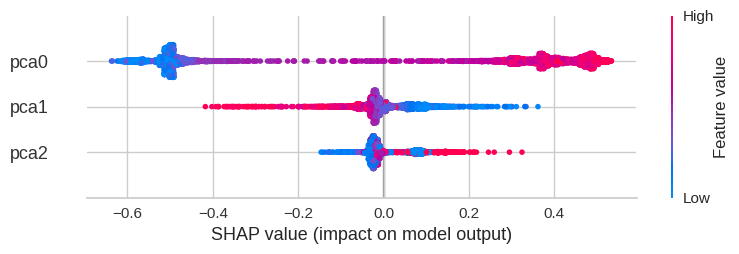

In [71]:
import shap
interpret_model(tuned_rf_pca, plot='summary')